**Image Processing Laboratory (045108) - Meeting 2/4**  

Signal and Image Processing Lab (SIPL) & Vision and Image Sciences Lab (VISL)  
The Andrew and Erna Viterbi Faculty of Electrical and Computer Engineering    
Technion - Israel Institute of Technology

In [55]:
import os
import numpy as np
from scipy.ndimage import gaussian_filter1d
from skimage import color, feature, filters, io, metrics, transform, util
import matplotlib.pyplot as plt
from lab_code import flir_image_extractor

# Set this flag to True to execute the notebook without waiting for user input
DISABLE_GUI = False

# Thermal constants
THERMAL_MIN_VAL = 9620
THERMAL_MAX_VAL = 18070


# Helper Functions

In [56]:
def visual_prep(filename, convert_to_grayscale=True):
    """
    Prepares an image for the lab by reading, converting to grayscale (if necessary),
    normalizing, and resizing.

    Args:
        filename (str): Path to the image file.
        convert_to_grayscale (bool, optinal): Flag to control grayscale conversion.
            Defaults to True.

    Returns:
        numpy.ndarray: The prepared image array.
    """

    image = io.imread(filename)#[..., :3]
    if convert_to_grayscale and len(image.shape) == 3:
       image = color.rgb2gray(image)

    NEW_WIDTH = 1600
    # Resize the image to TARGET_WIDTH columns keeping the original aspect ratio
    height, width = image.shape[:2]
    resize_factor = width / NEW_WIDTH
    new_height = int(height / resize_factor)

    image = transform.resize(image, (new_height, NEW_WIDTH), anti_aliasing=True)
    image = util.img_as_ubyte(image)

    return image


def thermal_prep(filename):
    """
    Prepares a FLIR thermal image for the lab by reading it.

    Args:
        filename (str): Path to the FLIR thermal image file.

    Returns:
        numpy.ndarray: The prepared thermal image.
    """

    image_extractor = flir_image_extractor.FlirImageExtractor()
    image_extractor.process_image(filename)
    thermal = image_extractor.extract_thermal_image()

    return thermal


def thermal_prep_uint8(filename):
    """
    Prepares a FLIR thermal image for the lab by reading and converting it to uint8 format.

    Args:
        filename (str): Path to the FLIR thermal image file.

    Returns:
        numpy.ndarray: The prepared thermal image in uint8 format.
    """

    thermal = thermal_prep(filename)

    # Create a copy of the input image
    qth = np.copy(thermal).astype(np.float32)

    # Divide the pixel value range into 'levels' number of buckets
    levels = 256
    buckets = np.linspace(THERMAL_MIN_VAL, THERMAL_MAX_VAL, levels + 1)

    # Quantize the image
    for i in range(levels):
        mask = (thermal >= buckets[i]) & (thermal < buckets[i + 1])
        qth[mask] = i

    qth = qth.astype(np.uint8)

    return qth


# Preparation - Assignment 3 - Denoising Using Linear Diffusion

In [57]:
def linear_diffusion_1D(iterations_num, signal, sigma):
    """
    Performs 1D linear diffusion on a signal using Gaussian filtering.

    Args:
        iterations_num (int): Number of diffusion iterations.
        signal (np.ndarray): 1D array containing the signal values.
        sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
        np.ndarray: The smoothed signal after linear diffusion.
    """

    K = 2   # sensitivity value

    for i in range(iterations_num):
        signal = gaussian_filter1d(signal, sigma/K**2)

    return signal


Average value of noisy signal: 0.5420
Mean after N=10:   0.5420
Mean after N=50:   0.5420
Mean after N=200:  0.5420


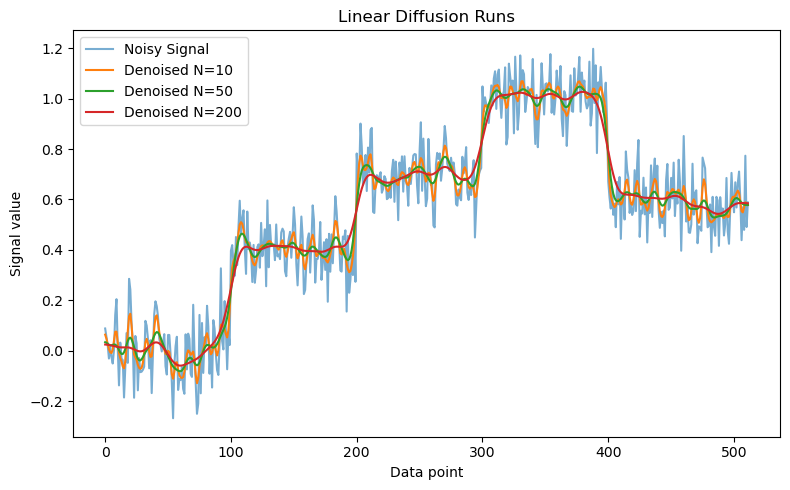

In [58]:
# Questions 2 & 3

step_signal = np.zeros(512)
# TODO: Create a step signal with different heights
step_signal[100:200] = 0.4
step_signal[200:300] = 0.7
step_signal[300:400] = 1.0
step_signal[400:] = 0.6
# TODO: Add white Gaussian noise
white_noise = np.random.normal(loc=0.0, scale=0.1, size=step_signal.shape)
noisy_signal = step_signal + white_noise

# Print the mean of the noisy signal
print(f"Average value of noisy signal: {np.mean(noisy_signal):.4f}")

# TODO: Run linear diffusion with different number of steps
sigma = 2
denoised_10 = linear_diffusion_1D(10, noisy_signal.copy(), sigma)
denoised_50 = linear_diffusion_1D(50, noisy_signal.copy(), sigma)
denoised_200 = linear_diffusion_1D(200, noisy_signal.copy(), sigma)
# TODO: Print the mean of the denoised signals

plt.figure(figsize=(8, 5))
# TODO: Show results
print(f"Mean after N=10:   {np.mean(denoised_10):.4f}")
print(f"Mean after N=50:   {np.mean(denoised_50):.4f}")
print(f"Mean after N=200:  {np.mean(denoised_200):.4f}")
#show figure
plt.plot(noisy_signal, label='Noisy Signal', alpha=0.6)
plt.plot(denoised_10, label='Denoised N=10')
plt.plot(denoised_50, label='Denoised N=50')
plt.plot(denoised_200, label='Denoised N=200')
plt.legend()
plt.xlabel("Data point")
plt.ylabel("Signal value")
plt.title("Linear Diffusion Runs")
plt.tight_layout()
plt.show()


In [59]:
def linear_diffusion_2D(iterations_num, image, sigma):
    """
    Performs 2D linear diffusion on an image using Gaussian filtering.

    Args:
        iterations_num (int): Number of diffusion iterations.
        image (np.ndarray): 2D array containing the image values.
        sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
        np.ndarray: The smoothed image after linear diffusion.
    """

    K = 3   # sensitivity value

    for i in range(iterations_num):
        image = filters.gaussian(image, sigma/K**2)

    return image


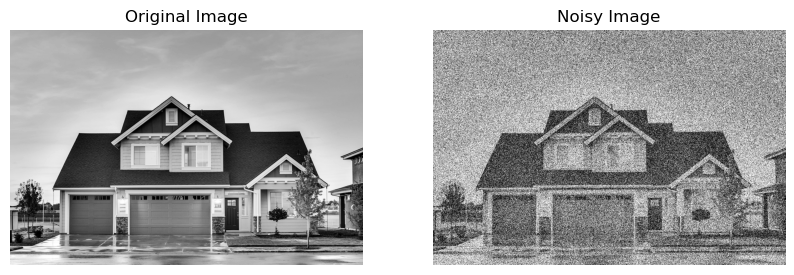

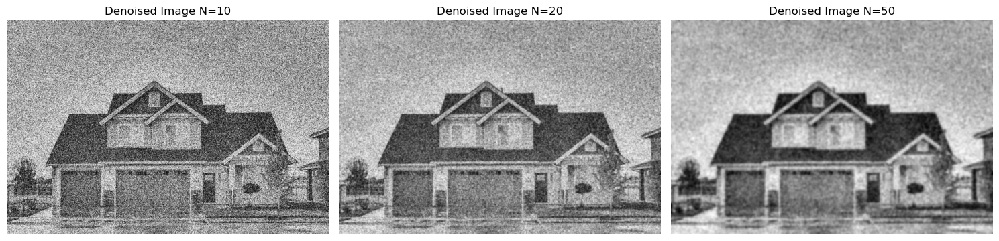

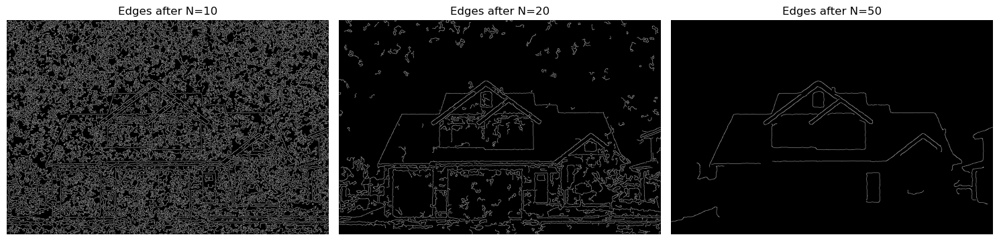

In [60]:
# Question 4

# TODO: Load image as grayscale
image = io.imread('images/house.jpg', as_gray=True)

# TODO: Add white Gaussian noise
noisy_image = util.random_noise(image, mode='gaussian', var=0.3)

sigma = 2
# TODO: Run linear diffusion with different number of steps
d10 = linear_diffusion_2D(10 , noisy_image, sigma=3)
d20 = linear_diffusion_2D(20 , noisy_image, sigma=4)
d50 = linear_diffusion_2D(50 , noisy_image, sigma=5)
# TODO: Perform Canny edge detection on the denoised images using the 'feature.canny' function
edges_10 = feature.canny(d10, sigma, low_threshold=0.1, high_threshold=0.3)
edges_20 = feature.canny(d20, sigma, low_threshold=0.1, high_threshold=0.3)
edges_50 = feature.canny(d50, sigma, low_threshold=0.1, high_threshold=0.3)

# Display the original image
plt.subplots(1, 2, figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(image,  cmap='gray')
plt.axis('off')
plt.title('Original Image')

# Display the noisy image
plt.subplot(1,2,2)
plt.imshow(noisy_image, cmap='gray')
plt.axis('off')
plt.title('Noisy Image')
plt.show()

# TODO: Display the denoised images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(d10, cmap='gray'); axs[0].set_title('Denoised Image N=10')
axs[1].imshow(d20, cmap='gray'); axs[1].set_title('Denoised Image N=20')
axs[2].imshow(d50, cmap='gray'); axs[2].set_title('Denoised Image N=50')
for ax in axs: ax.axis('off')
plt.tight_layout()
plt.show()
# TODO: Display the edges of the denoised images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(edges_10, cmap='gray'); axs[0].set_title('Edges after N=10')
axs[1].imshow(edges_20, cmap='gray'); axs[1].set_title('Edges after N=20')
axs[2].imshow(edges_50, cmap='gray'); axs[2].set_title('Edges after N=50')
for ax in axs: ax.axis('off')
plt.tight_layout()
plt.show()

# Assignment 1 - Color Images

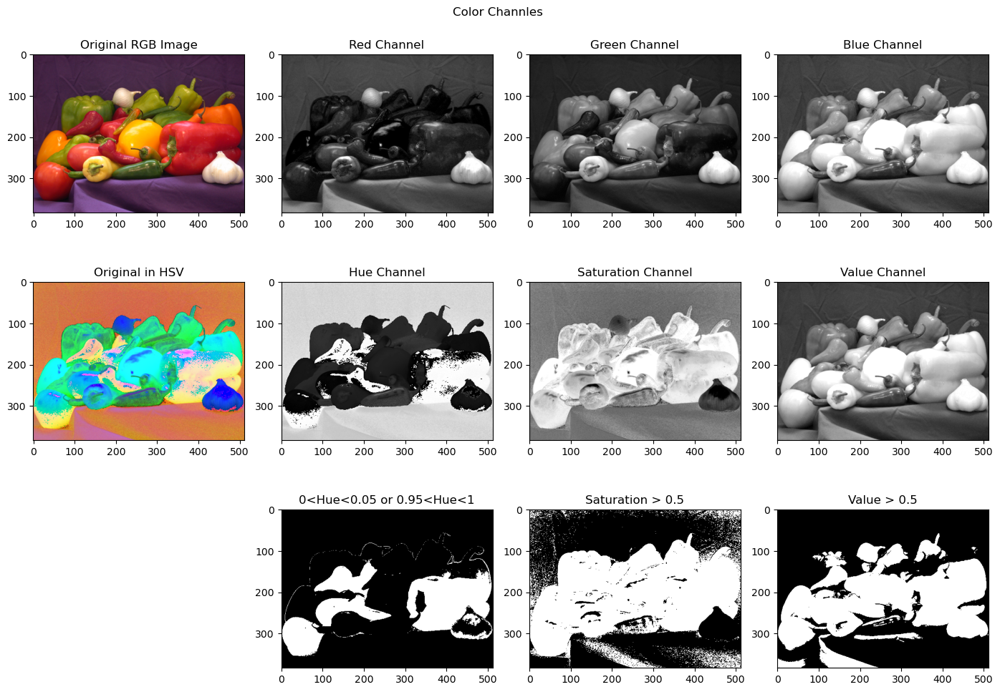

In [61]:
# Question 1

# Load the image
peppers_image = io.imread('images/peppers.png')

# Convert from RGB to HSV
peppers_hsv = color.rgb2hsv(peppers_image)

# Split color channels
peppers_r = peppers_image[:,:,2]
peppers_g = peppers_image[:,:,1]
peppers_b = peppers_image[:,:,0]
peppers_h = peppers_hsv[:,:,0]
peppers_s = peppers_hsv[:,:,1]
peppers_v = peppers_hsv[:,:,2]

# Show color channels
plt.figure(figsize=(14, 10))
plt.suptitle('Color Channles')

plt.subplot(3,4,1); plt.imshow(peppers_image); plt.title('Original RGB Image')
plt.subplot(3,4,2); plt.imshow(peppers_r, cmap='gray'); plt.title('Red Channel')
plt.subplot(3,4,3); plt.imshow(peppers_g, cmap='gray'); plt.title('Green Channel')
plt.subplot(3,4,4); plt.imshow(peppers_b, cmap='gray'); plt.title('Blue Channel')

plt.subplot(3,4,5); plt.imshow(peppers_hsv); plt.title('Original in HSV')
plt.subplot(3,4,6); plt.imshow(peppers_h, cmap='gray'); plt.title('Hue Channel')
plt.subplot(3,4,7); plt.imshow(peppers_s, cmap='gray'); plt.title('Saturation Channel')
plt.subplot(3,4,8); plt.imshow(peppers_v, cmap='gray'); plt.title('Value Channel')

plt.subplot(3,4,10); plt.imshow(np.logical_or(peppers_h > 0.95, peppers_h < 0.05), cmap='gray'); plt.title('0<Hue<0.05 or 0.95<Hue<1')
plt.subplot(3,4,11); plt.imshow(peppers_s > 0.5, cmap='gray'); plt.title('Saturation > 0.5')
plt.subplot(3,4,12); plt.imshow(peppers_v > 0.5, cmap='gray'); plt.title('Value > 0.5')

plt.tight_layout()
plt.show()


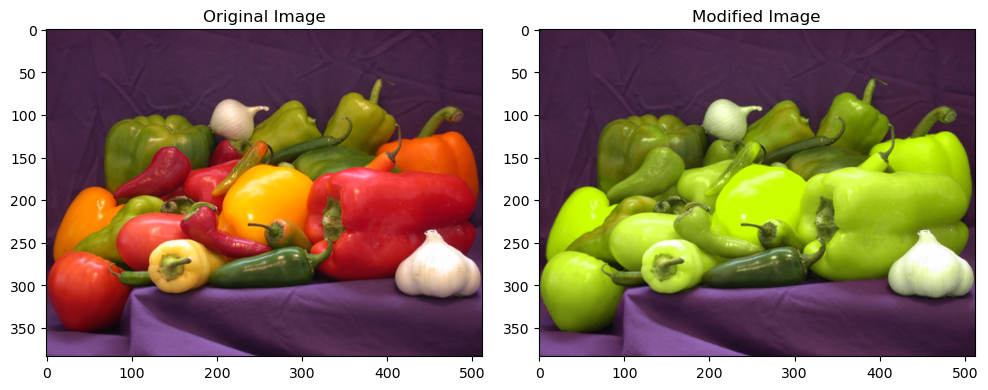

In [62]:
# Load the image
peppers_image = io.imread('images/peppers.png')

# Convert from RGB to HSV
peppers_hsv = color.rgb2hsv(peppers_image)
# Create a mask of peppers' hue values in a specific range
peppers_mask = np.logical_or(peppers_h >= 0.92, peppers_h <= 0.16)

#  Where the mask is True, set the hue values to a specific value, else don't change them
peppers_h_modified = np.where(peppers_mask, 0.2, peppers_h)

peppers_hsv_modified = peppers_hsv.copy()
peppers_hsv_modified[:, :, 0] = peppers_h_modified

# Convert back to RGB colorspace
peppers_modified_rgb = color.hsv2rgb(peppers_hsv_modified)

# Show original and modified image
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(peppers_image)
plt.title('Original Image')

plt.subplot(1,2,2)
plt.imshow(peppers_modified_rgb)
plt.title('Modified Image')

plt.tight_layout()
plt.show()


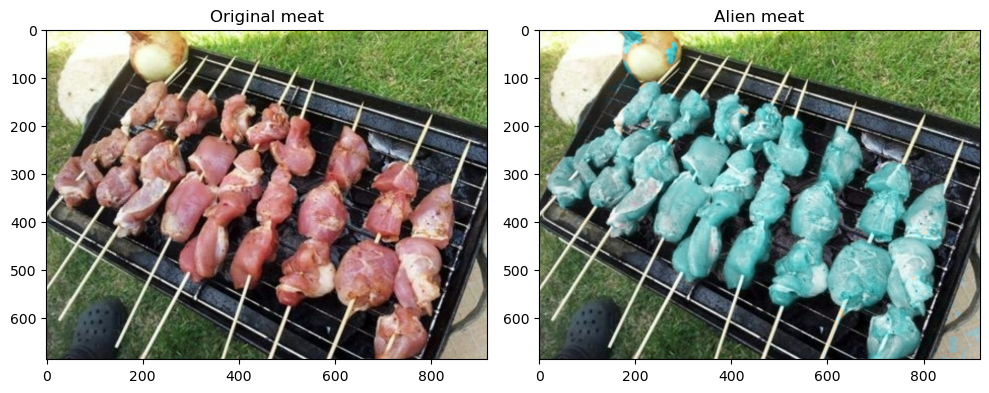

In [63]:
# Question 3

# TODO: Write code that uses the HSV colorspace to change the
#       dominant colors in the image you received from the instructor


# Load the image
kebab_image = io.imread('images/kebab.png')[..., :3]
#kebab_image = visual_prep(kebab_image)
# Convert from RGB to HSV
kebab_hsv = color.rgb2hsv(kebab_image)
kebab_h = kebab_hsv[:,:,0]
# Create a mask of peppers' hue values in a specific range
kebab_mask = np.logical_or(kebab_h >= 0.90, kebab_h <= 0.10)

#  Where the mask is True, set the hue values to a specific value, else don't change them
kebab_h_modified = np.where(kebab_mask, 0.5, kebab_h)

kebab_hsv_modified = kebab_hsv.copy()
kebab_hsv_modified[:, :, 0] = kebab_h_modified

# Convert back to RGB colorspace
kebab_modified_rgb = color.hsv2rgb(kebab_hsv_modified)

# Show original and modified image
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(kebab_image)
plt.title('Original meat')

plt.subplot(1,2,2)
plt.imshow(kebab_modified_rgb)
plt.title('Alien meat')

plt.tight_layout()
plt.show()






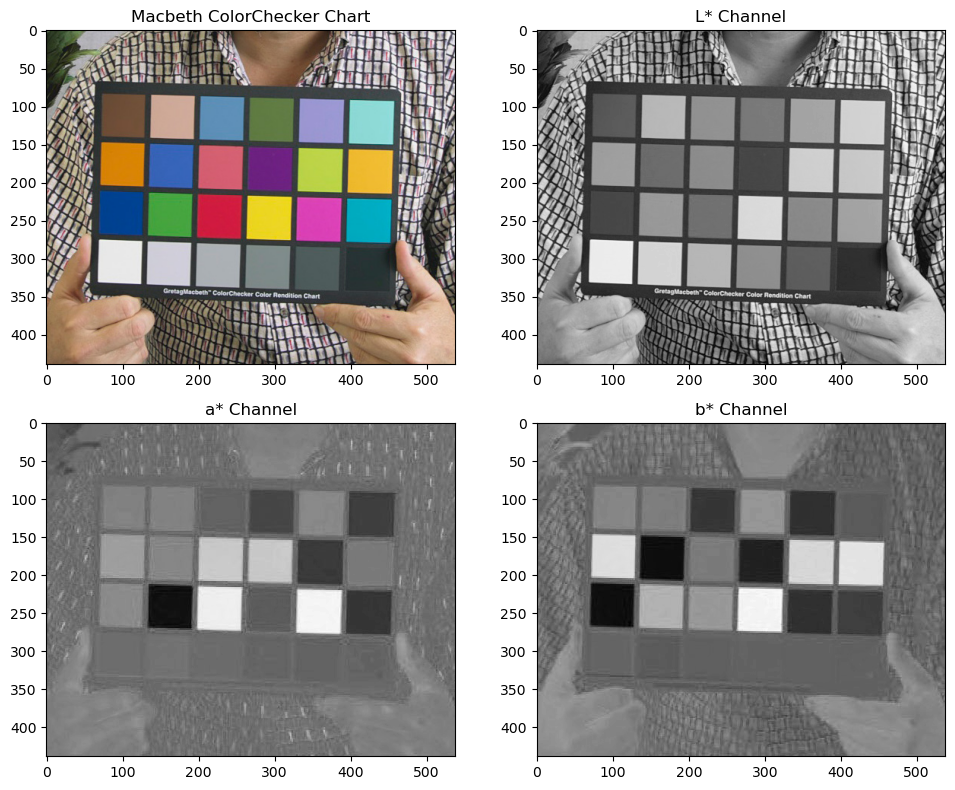

In [64]:
# Question 4

# Load the ColorChecker image
colorchecker = io.imread('images/colorchecker.jpg')

# Convert to LAB colorspace
colorchecker_lab = color.rgb2lab(colorchecker)

# Show the original image and its LAB channels
plt.figure(figsize=(10, 8))

plt.subplot(2,2,1)
plt.imshow(colorchecker)
plt.title('Macbeth ColorChecker Chart')

channels = ['L*', 'a*', 'b*']
for i, channel in enumerate(channels):
    plt.subplot(2,2,i+2)
    plt.imshow(colorchecker_lab[:,:,i], cmap='gray')
    plt.title(f'{channel} Channel')

plt.tight_layout()
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-59.16708439314336..100.0].


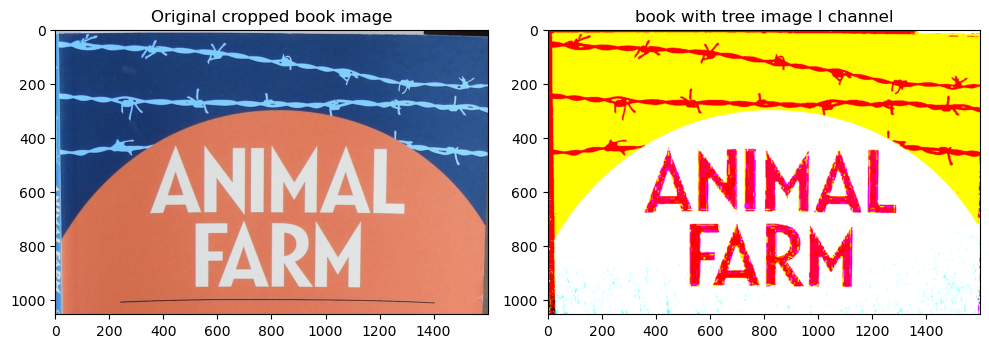

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-59.16708439314336..98.20370683054799].


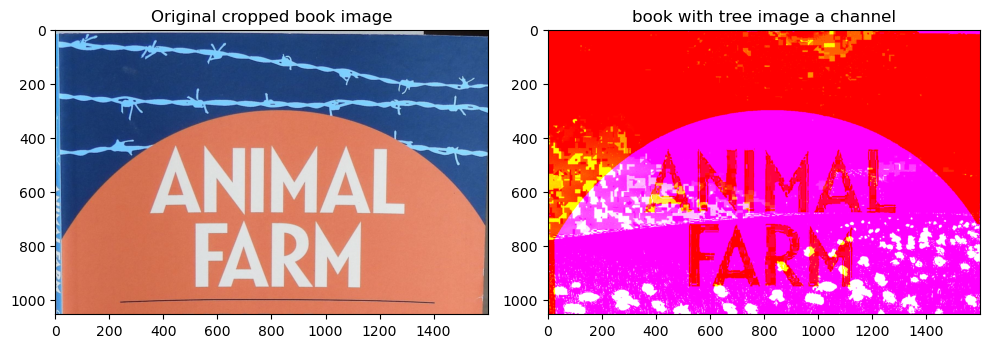

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-59.16708439314336..98.20370683054799].


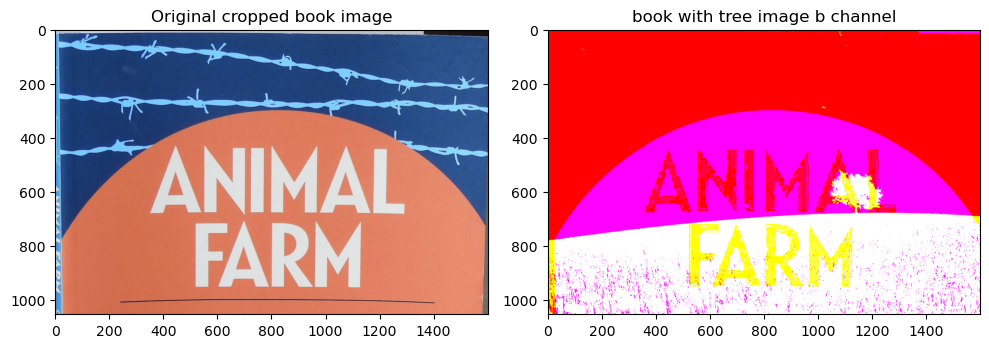

In [79]:
# Question 5

def crop_to_min_size(image1, image2):
    """
    Crops two images to their minimum size.

    Args:
        image1 (numpy.ndarray): The first image to crop.
        image2 (numpy.ndarray): The second image to crop.

    Returns:
        A tuple of two cropped images of type numpy.ndarray, both with the same dimensions.
    """
    # Determine the minimum height and width
    min_height = min(image1.shape[0], image2.shape[0])
    min_width = min(image1.shape[1], image2.shape[1])

    # Crop both images to the minimum size
    cropped_image1 = image1[:min_height, :min_width]
    cropped_image2 = image2[:min_height, :min_width]

    return cropped_image1, cropped_image2


# TODO: Read two of the visual images you took
visual_image1 = visual_prep('images/book.jpg', False)
visual_image2 = visual_prep('images/tree.jpg', False)

# Crop the two images to the same dimensions
cropped_visual_image1, cropped_visual_image2 = crop_to_min_size(visual_image1, visual_image2)

# TODO: convert the two images to the LAB colorspace
lab_image_1 = color.rgb2lab(cropped_visual_image1)
lab_image_2 = color.rgb2lab(cropped_visual_image2)

# TODO: Replace the L channel of the first image with the L channel of the
#       second image and show the result
img1_L = lab_image_1[:,:,0].copy()
img2_L = lab_image_2[:,:,0].copy()
l_chan_img = lab_image_1.copy()
l_chan_img[:,:,0] = img2_L
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(cropped_visual_image1)
plt.title('Original cropped book image')

plt.subplot(1,2,2)
plt.imshow(l_chan_img)
plt.title('book with tree image l channel')

plt.tight_layout()
plt.show()
# TODO: Replace the a channel of the first image with the a channel of the
#       second image and show the result
img1_A = lab_image_1[:, :, 1].copy()
img2_A = lab_image_2[:, :, 1].copy()
a_chan_img = lab_image_1.copy()
a_chan_img[:, :, 1] = img2_A
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(cropped_visual_image1)
plt.title('Original cropped book image')

plt.subplot(1,2,2)
plt.imshow(a_chan_img)
plt.title('book with tree image a channel')

plt.tight_layout()
plt.show()
# TODO: Replace the b channel of the first image with the b channel of the
#       second image and show the result
img1_b = lab_image_1[:, :, 2].copy()
img2_b = lab_image_2[:, :, 2].copy()
b_chan_img = lab_image_1.copy()
b_chan_img[:, :, 1] = img2_b
plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
plt.imshow(cropped_visual_image1)
plt.title('Original cropped book image')

plt.subplot(1,2,2)
plt.imshow(b_chan_img)
plt.title('book with tree image b channel')

plt.tight_layout()
plt.show()

# Assignment 2 - Denoising Using Spatial Filtering

In [81]:
# Questions 1-3

if not DISABLE_GUI:
    # Run image denoising app
    !python lab_code/im_denoising_app.py


Exception in Tkinter callback
Traceback (most recent call last):
  File "/opt/anaconda3/envs/ip-env/lib/python3.11/tkinter/__init__.py", line 1967, in __call__
    return self.func(*args)
           ^^^^^^^^^^^^^^^^
  File "/home/ip_user5/Documents/lavie_shahar_IP_lab/IP_lab2/meeting2/lab_code/im_denoising_app.py", line 168, in reset
    self.corrupted_image = self.original_image.copy()
                           ^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has no attribute 'copy'


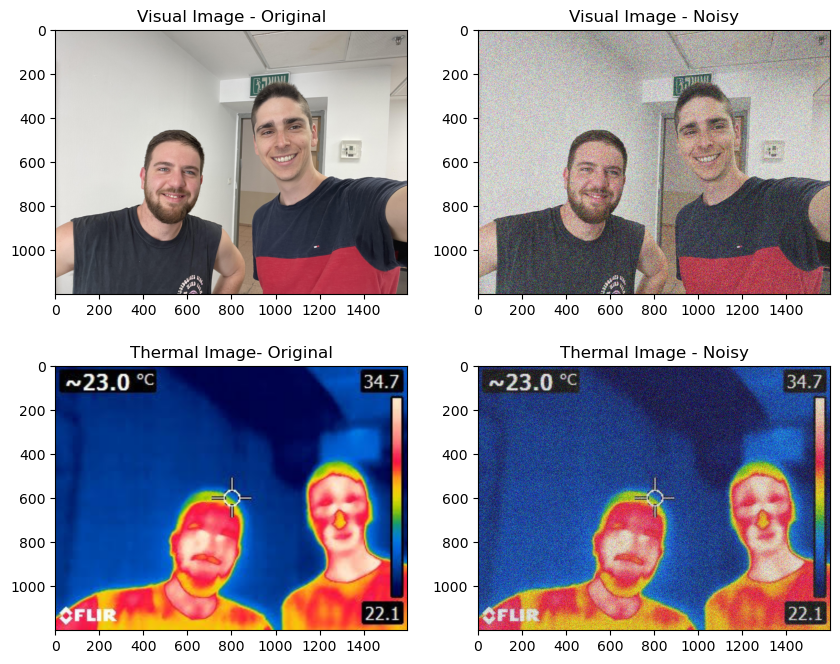

PSNR for visual noisy image: 11.78
PSNR for thermal noisy image: 12.05
SSIM for visual noisy image: 0.04
SSIM for thermal noisy image: 0.03


In [93]:
# Question 4

# TODO: Read visual image and prepare it for the lab
visual_image = visual_prep('images/our_selfie.jpg', False)

# TODO: Read thermal image and prepare it for the lab
#thermal_image_uint8 = thermal_prep_uint8('images/our_selfie.jpg')
thermal_image_uint8 = visual_prep('images/our_selfie_flir.jpg', False)
# TODO: Add White Gaussian Noise to the visual image
#       Use variance values of 0.01, 0.05, 0.1
noisy_visual = util.random_noise(visual_image, mode='gaussian', mean=0, var=0.1)
noisy_visual = 255*noisy_visual
noisy_visual = noisy_visual.astype(np.uint8)

# TODO: Add White Gaussian Noise to the thermal image
#       Use variance values of 0.01, 0.05, 0.1
noisy_thermal = util.random_noise(thermal_image_uint8, mode='gaussian', mean=0, var=0.1)
noisy_thermal = util.img_as_ubyte(noisy_thermal)

# Show the two original and the two noisy images
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
plt.imshow(visual_image, cmap='gray')
plt.title('Visual Image - Original')
plt.subplot(2, 2, 2)
plt.imshow(noisy_visual, cmap='gray')
plt.title('Visual Image - Noisy')
plt.subplot(2, 2, 3)
plt.imshow(thermal_image_uint8, cmap='gray')
plt.title('Thermal Image- Original')
plt.subplot(2, 2, 4)
plt.imshow(noisy_thermal, cmap='gray')
plt.title('Thermal Image - Noisy')
plt.show()

# TODO: Calculate PSNR between original and noisy images
psnr_visual = metrics.peak_signal_noise_ratio(visual_image, noisy_visual)
psnr_thermal = metrics.peak_signal_noise_ratio(thermal_image_uint8, noisy_thermal)

print(f'PSNR for visual noisy image: {psnr_visual:.2f}')
print(f'PSNR for thermal noisy image: {psnr_thermal:.2f}')

# TODO: Calculate SSIM between original and noisy images
ssim_visual = metrics.structural_similarity(visual_image, noisy_visual, channel_axis=2)
ssim_thermal = metrics.structural_similarity(thermal_image_uint8, noisy_thermal, channel_axis=2)

print(f'SSIM for visual noisy image: {ssim_visual:.2f}')
print(f'SSIM for thermal noisy image: {ssim_thermal:.2f}')


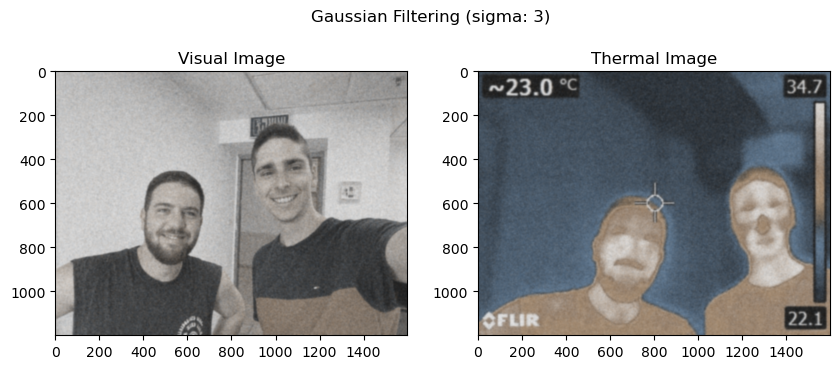

Sigma: 3
PSNR for visual Gaussian filtered image: 21.63
PSNR for thermal Gaussian filtered image: 13.26
SSIM for visual Gaussian filtered image: 0.79
SSIM for thermal Gaussian filtered image: 0.55


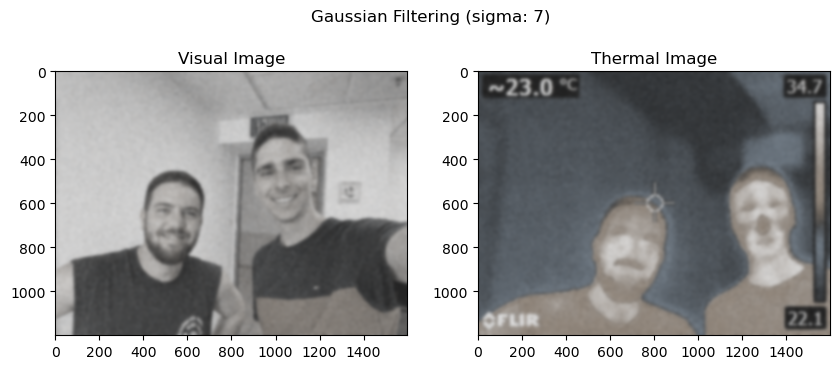

Sigma: 7
PSNR for visual Gaussian filtered image: 20.58
PSNR for thermal Gaussian filtered image: 12.19
SSIM for visual Gaussian filtered image: 0.79
SSIM for thermal Gaussian filtered image: 0.54


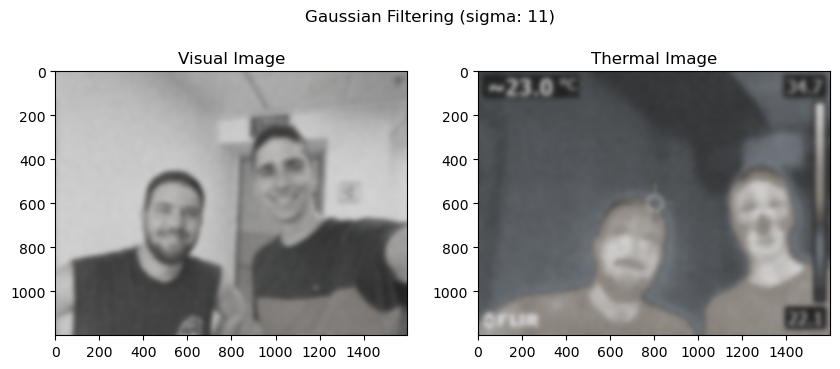

Sigma: 11
PSNR for visual Gaussian filtered image: 19.96
PSNR for thermal Gaussian filtered image: 11.84
SSIM for visual Gaussian filtered image: 0.78
SSIM for thermal Gaussian filtered image: 0.53


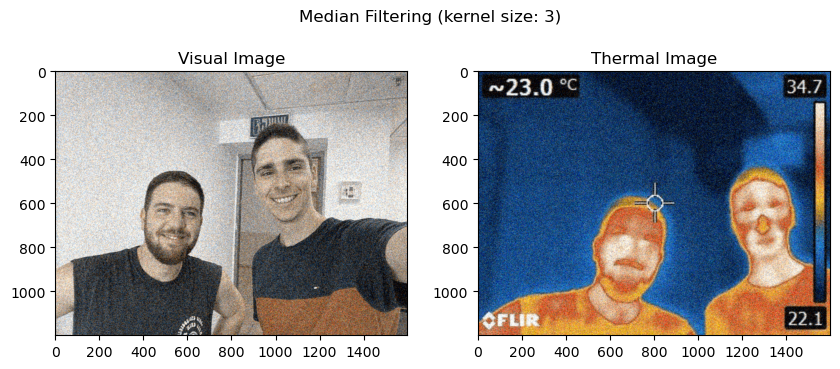

Kernel Size: 3
PSNR for visual median filtered image: 20.22
PSNR for thermal median filtered image: 17.49
SSIM for visual median filtered image: 0.19
SSIM for thermal median filtered image: 0.14


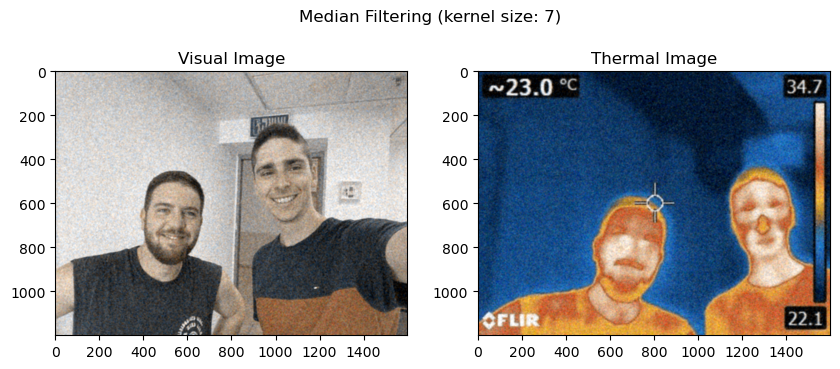

Kernel Size: 7
PSNR for visual median filtered image: 24.63
PSNR for thermal median filtered image: 19.40
SSIM for visual median filtered image: 0.53
SSIM for thermal median filtered image: 0.43


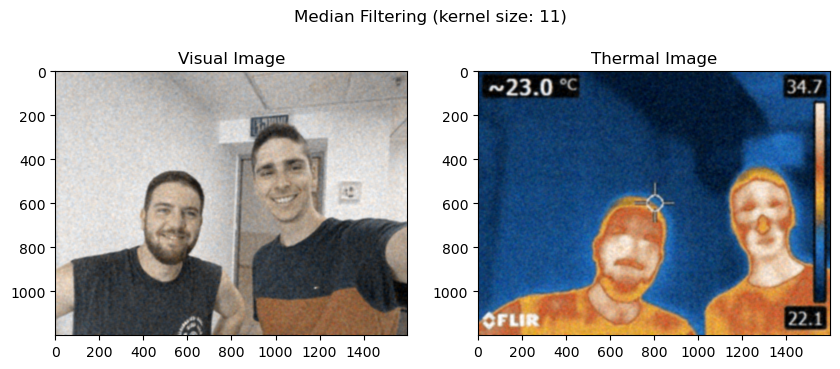

Kernel Size: 11
PSNR for visual median filtered image: 25.30
PSNR for thermal median filtered image: 19.55
SSIM for visual median filtered image: 0.69
SSIM for thermal median filtered image: 0.58


In [149]:
# Question 5

# Gaussian filtering
sigma_values = [3, 7, 11]
for sigma in sigma_values:
    # TODO: Filter the noisy visual image and noisy thermal image with Gaussian filter
    #       Use the 'filters.gaussian' function with sigma values of 3, 7, 11
    visual_image_gaussian = filters.gaussian(noisy_visual, sigma)
    thermal_image_gaussian = filters.gaussian(noisy_thermal, sigma)
    visual_image_gaussian = util.img_as_ubyte(visual_image_gaussian)
    thermal_image_gaussian = util.img_as_ubyte(thermal_image_gaussian)

    # TODO: Show the two noisy images after Gaussian filtering
    plt.figure(figsize=(10, 4))
    plt.suptitle(f"Gaussian Filtering (sigma: {sigma})")
    plt.subplot(1, 2, 1)
    plt.imshow(visual_image_gaussian, cmap='gray')
    plt.title('Visual Image')
    plt.subplot(1, 2, 2)
    plt.imshow(thermal_image_gaussian, cmap='gray')
    plt.title('Thermal Image')
    plt.show()

    # TODO: Calculate PSNR & SSIM values between original and Gaussian filtered images
    #       Using 'skimage.metrics'
    psnr_visual_gaussian = metrics.peak_signal_noise_ratio(visual_image_gaussian, visual_image)
    psnr_thermal_gaussian = metrics.peak_signal_noise_ratio(thermal_image_gaussian, thermal_image_uint8)
    ssim_visual_gaussian = metrics.structural_similarity(visual_image_gaussian, visual_image, channel_axis=2)
    ssim_thermal_gaussian = metrics.structural_similarity(thermal_image_gaussian, thermal_image_uint8, channel_axis=2)

    print(f'Sigma: {sigma}')
    print(f'PSNR for visual Gaussian filtered image: {psnr_visual_gaussian:.2f}')
    print(f'PSNR for thermal Gaussian filtered image: {psnr_thermal_gaussian:.2f}')
    print(f'SSIM for visual Gaussian filtered image: {ssim_visual_gaussian:.2f}')
    print(f'SSIM for thermal Gaussian filtered image: {ssim_thermal_gaussian:.2f}')

# Median filtering
kernel_size_values = [3, 7, 11]

for kernel_size in kernel_size_values:
    # TODO: Filter the noisy visual image and noisy thermal image with median filter
    #       Use the 'filters.median' function with kernal size values of 3, 7, 11
    #       To select the kernel size, use the 'foorprint' parameter with 'np.ones'
    # footprint1 = np.zeros(noisy_visual.shape)
    footprint1 = np.ones((kernel_size, kernel_size,3)).astype("uint8")
    visual_image_median = filters.median(noisy_visual, footprint=footprint1, behavior='ndimage')
    thermal_image_median = filters.median(noisy_thermal, footprint=footprint1,behavior='ndimage')
    visual_image_median = util.img_as_ubyte(visual_image_median)
    thermal_image_median = util.img_as_ubyte(thermal_image_median)

    # TODO: Show the two noisy images after median filtering
    plt.figure(figsize=(10, 4))
    plt.suptitle(f"Median Filtering (kernel size: {kernel_size})")
    plt.subplot(1, 2, 1)
    plt.imshow(visual_image_median, cmap='gray')
    plt.title('Visual Image')
    plt.subplot(1, 2, 2)
    plt.imshow(thermal_image_median, cmap='gray')
    plt.title('Thermal Image')
    plt.show()

    # TODO: Calculate PSNR & SSIM values between original and median filtered images
    #       Using 'skimage.metrics'
    psnr_visual_median = metrics.peak_signal_noise_ratio(visual_image_median, visual_image)
    psnr_thermal_median = metrics.peak_signal_noise_ratio(thermal_image_median, thermal_image_uint8)
    ssim_visual_median = metrics.structural_similarity(visual_image_median, visual_image, channel_axis=2)
    ssim_thermal_median = metrics.structural_similarity(thermal_image_median, thermal_image_uint8, channel_axis=2)

    print(f'Kernel Size: {kernel_size}')
    print(f'PSNR for visual median filtered image: {psnr_visual_median:.2f}')
    print(f'PSNR for thermal median filtered image: {psnr_thermal_median:.2f}')
    print(f'SSIM for visual median filtered image: {ssim_visual_median:.2f}')
    print(f'SSIM for thermal median filtered image: {ssim_thermal_median:.2f}')



# Assignment 3 - Denoising Using Non-linear Diffusion

In [108]:
def anisotropic_diffusion(noisy_image, original_image, iterations_num, delta_t=0.2, kappa=20.0, stop_condition='fixed'):
    """
    Apply non-linear anisotropic diffusion process to the input image.

    Args:
      noisy_image (np.ndarray): The noisy image to be denoised.
      original_image (np.ndarray): The original image for calculating PSNR.
      iterations_num (int): The maximal number of iterations to perform for denoising.
      delta_t (float): Size of the time step for each iteration (default: 0.2).
      kappa (float): Sesitivity constant (default: 20.0).
      stop_condition (str): The condition for stopping the process (deafult: 'fixed'). One of:
           'fixed': Stop after iterations_num iterations.
           'PSNR': Stop when a maximal PSNR is reached.

    Returns:
       A tuple containing:
            np.ndarray: The denoised image.
            list[float]: A list of PSNR values for each iteration.
    """
    diffused_image = noisy_image.astype(np.float64)

    PSNR = []
    PSNR.append(metrics.peak_signal_noise_ratio(original_image, noisy_image))

    for iteration in range(iterations_num):
        diffused_image_filtered = filters.gaussian(diffused_image, sigma=1, preserve_range=True)

        # Calculate gradients of filtered image
        grad_north = np.pad(diffused_image_filtered[:-1, :] - diffused_image_filtered[1:, :], ((1, 0), (0, 0)))
        grad_south = np.pad(diffused_image_filtered[1:, :]- diffused_image_filtered[:-1, :], ((0, 1), (0, 0)))
        grad_east = np.pad(diffused_image_filtered[:, 1:] - diffused_image_filtered[:, :-1], ((0, 0), (0, 1)))
        grad_west = np.pad(diffused_image_filtered[:, :-1] - diffused_image_filtered[:, 1:], ((0, 0), (1, 0)))

        # Calculate diffusion coefficients
        c_north = 1 / (1 + (np.abs(grad_north) / kappa) ** 2)
        c_south = 1 / (1 + (np.abs(grad_south) / kappa) ** 2)
        c_east = 1 / (1 + (np.abs(grad_east) / kappa) ** 2)
        c_west = 1 / (1 + (np.abs(grad_west) / kappa) ** 2)

        # TODO: Update image for next iteration
        diffused_image = diffused_image + delta_t * (c_north * grad_north + c_south * grad_south + c_east * grad_east + c_west * grad_west)

        # Calculate PSNR
        diffused_image_uint8 = np.clip(diffused_image, 0, 255).astype(np.uint8)
        current_PSNR = metrics.peak_signal_noise_ratio(original_image, diffused_image_uint8)

        # Early stopping based on PSNR
        if stop_condition == 'PSNR' and iteration >= 1 and current_PSNR < np.max(PSNR[1:]):
            break

        PSNR.append(current_PSNR)

    return diffused_image_uint8, PSNR


PSNR for noisy image: 20.55
PSNR for anisotropic denoised image, kappa=10: 21.17


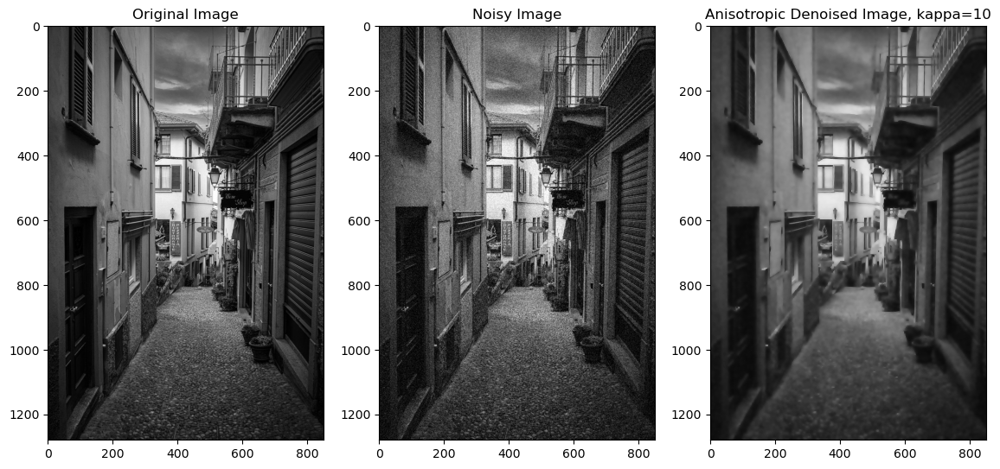

In [110]:
# Question 1

italy_image = io.imread("images/italy_street.jpg", as_gray=True)
italy_image = util.img_as_ubyte(italy_image)

# TODO: Add White Gaussian Noise to italy_image
italy_image_noisy = util.random_noise(italy_image, mode='gaussian', mean=0, var=0.01)
italy_image_noisy = util.img_as_ubyte(italy_image_noisy)

# TODO: Apply anisotropic diffusion to italy_image_noisy
italy_image_denoised_k10, diffusion_psnr_k10 = anisotropic_diffusion(italy_image_noisy, italy_image, iterations_num=50, delta_t=0.2, kappa=10.0, stop_condition='fixed')

# Show PSNR values
print(f'PSNR for noisy image: {diffusion_psnr_k10[0]:.2f}')
print(f'PSNR for anisotropic denoised image, kappa=10: {diffusion_psnr_k10[-1]:.2f}')

# Show results
plt.figure(figsize=(14, 8))
plt.subplot(1, 3, 1)
plt.imshow(italy_image, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(italy_image_noisy, cmap='gray')
plt.title('Noisy Image')
plt.subplot(1, 3, 3)
plt.imshow(italy_image_denoised_k10, cmap='gray')
plt.title('Anisotropic Denoised Image, kappa=10')
plt.show()


PSNR for noisy image: 20.55
PSNR for anisotropic denoised image, kappa=40: 20.12


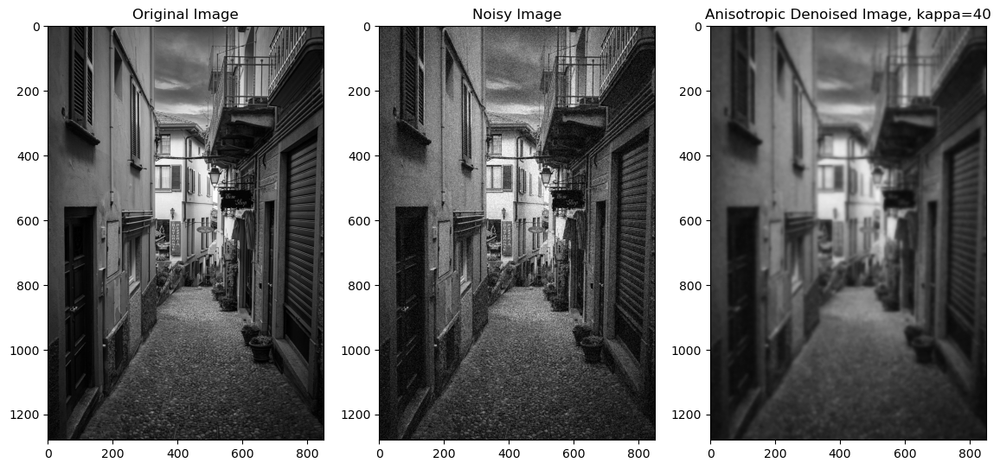

In [111]:
# Question 2

# TODO: Apply anisotropic diffusion to italy_image_noisy
italy_image_denoised_k40, diffusion_psnr_k40 = anisotropic_diffusion(italy_image_noisy, italy_image, iterations_num=50, delta_t=0.2, kappa=40.0, stop_condition='fixed')

# Show PSNR values
print(f'PSNR for noisy image: {diffusion_psnr_k40[0]:.2f}')
print(f'PSNR for anisotropic denoised image, kappa=40: {diffusion_psnr_k40[-1]:.2f}')

# Show results
plt.figure(figsize=(14, 8))
plt.subplot(1, 3, 1)
plt.imshow(italy_image, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(italy_image_noisy, cmap='gray')
plt.title('Noisy Image')
plt.subplot(1, 3, 3)
plt.imshow(italy_image_denoised_k40, cmap='gray')
plt.title('Anisotropic Denoised Image, kappa=40')
plt.show()


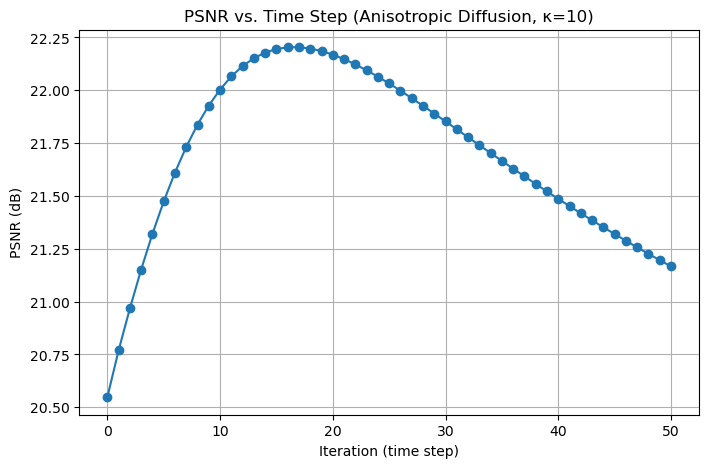

In [151]:
# Question 3

# TODO: Show PSNR as a function of the number of diffusion iterations (for kappa=10)
italy_image_denoised_k10, diffusion_psnr_k10 = anisotropic_diffusion(italy_image_noisy, italy_image, iterations_num=50, delta_t=0.2, kappa=10.0, stop_condition='fixed')
psnr_array = np.array(diffusion_psnr_k10)
max_iter = np.argmax(psnr_array)
max_psnr = psnr_array[max_iter]
#plot
plt.figure(figsize=(8, 5))
plt.plot(psnr_array, marker='o')
plt.title('PSNR vs. Time Step (Anisotropic Diffusion, κ=10)')
plt.xlabel('Iteration (time step)')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.show()


PSNR for noisy image: 20.55
PSNR for anisotropic denoised image, kappa=10 max PSNR: 22.20
Anisotropic denoised processing ran for 18 iterations


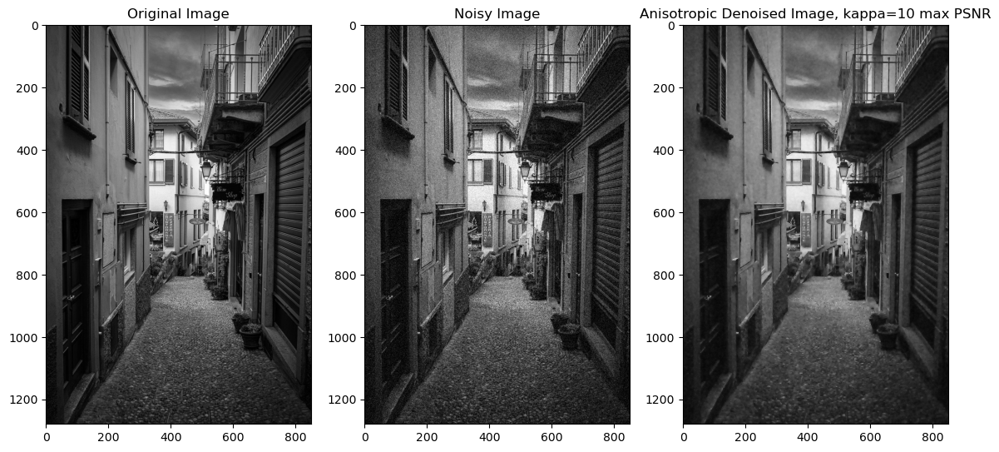

In [156]:
# Question 4

# TODO: Apply anisotropic diffusion to italy_image_noisy
italy_image_denoised_k10_maxPSNR, diffusion_psnr_k10_maxPSNR = anisotropic_diffusion(italy_image_noisy, italy_image, iterations_num=50, delta_t=0.2, kappa=10.0, stop_condition='PSNR')

# Show PSNR values and number of iterations
print(f'PSNR for noisy image: {diffusion_psnr_k10_maxPSNR[0]:.2f}')
print(f'PSNR for anisotropic denoised image, kappa=10 max PSNR: {diffusion_psnr_k10_maxPSNR[-1]:.2f}')
print(f'Anisotropic denoised processing ran for {len(diffusion_psnr_k10_maxPSNR)} iterations')

# Show results
plt.figure(figsize=(14, 8))
plt.subplot(1, 3, 1)
plt.imshow(italy_image, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(italy_image_noisy, cmap='gray')
plt.title('Noisy Image')
plt.subplot(1, 3, 3)
plt.imshow(italy_image_denoised_k10_maxPSNR, cmap='gray')
plt.title('Anisotropic Denoised Image, kappa=10 max PSNR')
plt.show()


σ=0.5 , PSNR for noisy image: 23.74
σ=0.5 , PSNR for anisotropic denoised image, max PSNR: 24.52
σ=0.5 , Anisotropic denoised processing ran for 6 iterations


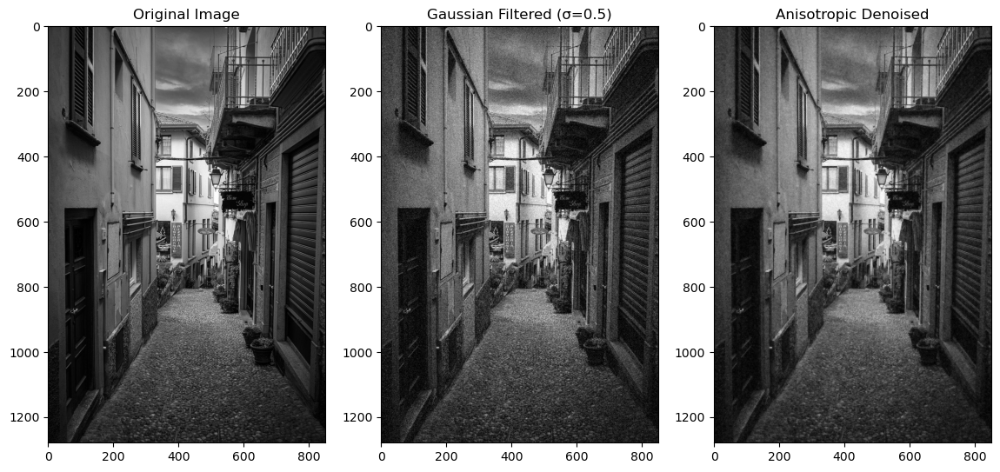

σ=0.7 , PSNR for noisy image: 24.82
σ=0.7 , PSNR for anisotropic denoised image, max PSNR: 24.93
σ=0.7 , Anisotropic denoised processing ran for 3 iterations


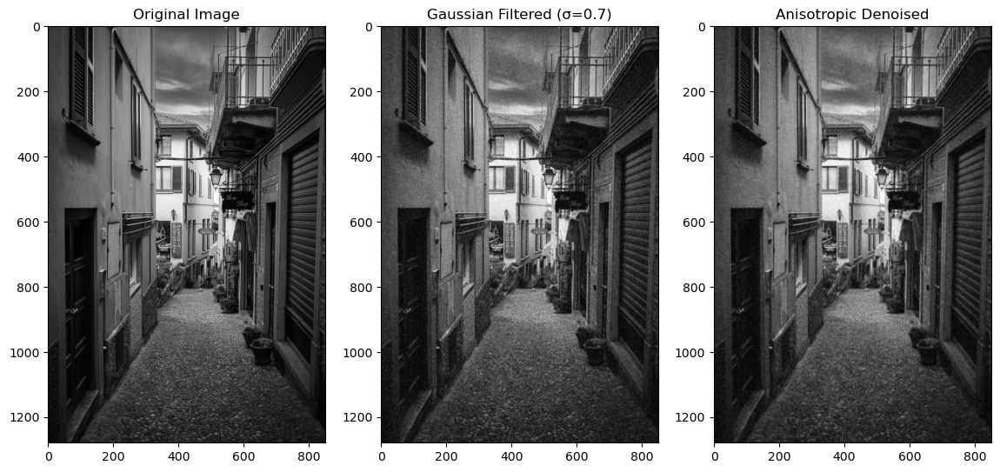

σ=1.0 , PSNR for noisy image: 24.03
σ=1.0 , PSNR for anisotropic denoised image, max PSNR: 23.98
σ=1.0 , Anisotropic denoised processing ran for 2 iterations


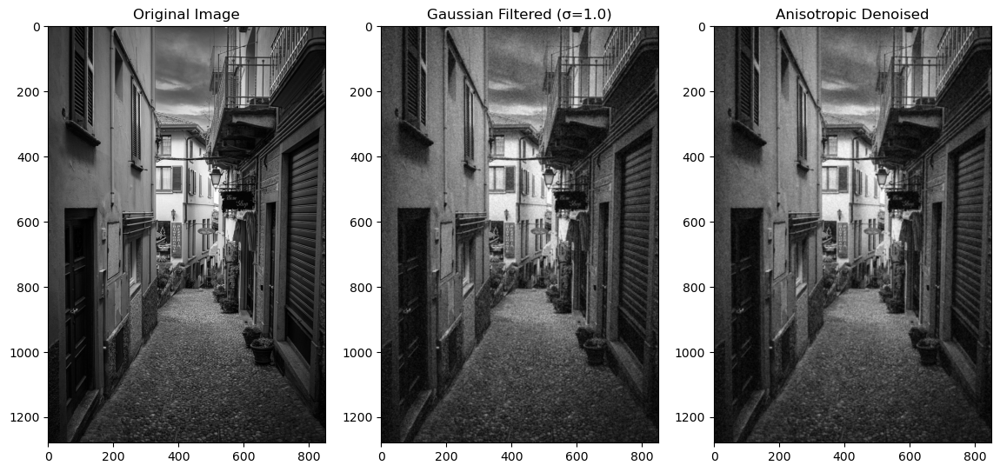

In [29]:
# Question 5

# TODO: Filter italy_image_noisy with a Gaussian filters with
#       standard deviation of 0.5, 0.7, 1 using 'filters.gaussian'
#       Don't forget to convert back to uint8 using 'util.img_as_ubyte'
sigmas = [0.5, 0.7, 1.0]
for sigma in sigmas:
    italy_image_filtered = filters.gaussian(italy_image_noisy, sigma)
    italy_image_filtered = util.img_as_ubyte(italy_image_filtered)
# TODO: Apply anisotropic diffusion to italy_image_filtered
    italy_image_filtered_denoised, diffusion_filtered_psnr = anisotropic_diffusion(italy_image_filtered, italy_image, iterations_num=50, delta_t=0.2, kappa=20.0, stop_condition='PSNR')


# Show PSNR values and number of iterations
    print(f'σ={sigma} , PSNR for noisy image: {diffusion_filtered_psnr[0]:.2f}')
    print(f'σ={sigma} , PSNR for anisotropic denoised image, max PSNR: {diffusion_filtered_psnr[-1]:.2f}')
    print(f'σ={sigma} , Anisotropic denoised processing ran for {len(diffusion_filtered_psnr)} iterations')


# Show results
    plt.figure(figsize=(14, 8))
    plt.subplot(1, 3, 1)
    plt.imshow(italy_image, cmap='gray')
    plt.title('Original Image')
    plt.subplot(1, 3, 2)
    plt.imshow(italy_image_filtered, cmap='gray')
    plt.title(f'Gaussian Filtered (σ={sigma})')
    plt.subplot(1, 3, 3)
    plt.imshow(italy_image_filtered_denoised, cmap='gray')
    plt.title('Anisotropic Denoised')
    plt.show()


# Assignment 4 - Denoising Using Total-Variation

In [39]:
def total_variation(image, iterations_num, delta_t=0.5, epsilon=1.0, use_fidelity_term=False):
    """
    Performs total variation denoising on a noisy image.

    Args:
        image (np.ndarray): The noisy image to be denoised.
        iterations_num (int): The number of iterations to perform for denoising.
        delta_t (float, default: 0.5): The size of the time step for each iteration.
        epsilon (float, default: 1.0): A small constant for regularization.
        use_fidelity_term (bool, default: False): Flag indicating whether to use the fidelity term.

    Returns:
        np.ndarray representing the denoised image.
    """

    height, width = image.shape
    epsilon2 = epsilon ** 2

    image = image.astype(np.float64)
    I0 = image
    lmbda = 0

    for _ in range(iterations_num):

        # Calculate first order image derivatives
        I_x = (image[:, list(range(1,width))+[width-1]] - image[:,[0] + list(range(width-1))]) / 2
        I_y = (image[list(range(1,height))+[height-1], :] - image[[0] + list(range(height-1)), :]) / 2

        # Calculate second order image derivatives
        I_xx = image[:, list(range(1,width))+[width-1]] + image[:,[0] + list(range(width-1))] - 2 * image
        I_yy = image[list(range(1,height))+[height-1], :] + image[[0] + list(range(height-1)), :] - 2 * image

        # Calculate diagonal image derivatives
        Dp = image[list(range(1,height))+[height-1], np.array(list(range(1,width))+[width-1]).reshape(width,1)].T + image[[0] + list(range(height-1)), np.array([0] + list(range(width-1))).reshape(width,1)].T
        Dm = image[[0] + list(range(height-1)), np.array(list(range(1,width))+[width-1]).reshape(width,1)].T + image[list(range(1,height))+[height-1], np.array([0] + list(range(width-1))).reshape(width,1)].T
        I_xy = (Dp - Dm) / 4

        # Calculate flow
        num = I_xx * (epsilon2 + I_y**2) - 2 * I_x * I_y * I_xy + I_yy * (epsilon2 + I_x**2)
        den = (epsilon2 + I_x**2 + I_y**2) ** (3 / 2)
        div = num / den

        # Update image using the evolution equation
        I_t = div + lmbda * (I0 - image)
        # TODO: Update image for next iteration
        image = image + delta_t * I_t

    # If fidelity term is enabled, update lambda
    if use_fidelity_term:
        lmbda = np.mean(div * (image - I0)) / np.var(image)

    return np.clip(image, 0, 255).astype(np.uint8)


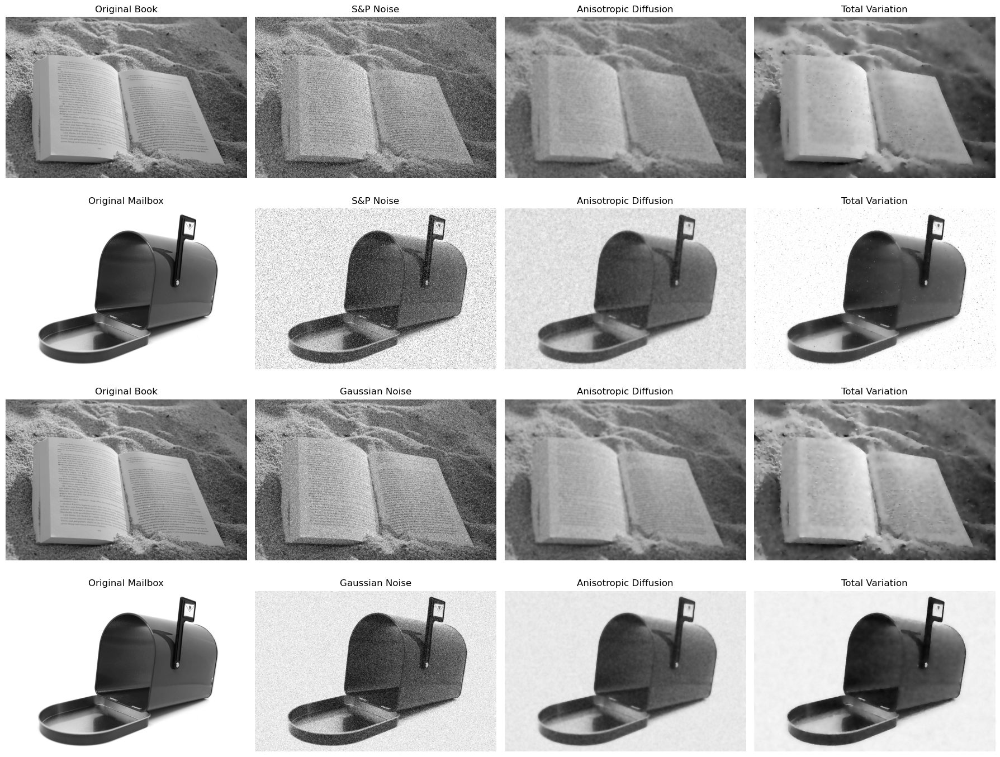

In [43]:
# Question 2

# TODO: Load two images
book_in_sand = util.img_as_ubyte(io.imread("images/book_in_sand.jpg", as_gray=True))
mailbox = util.img_as_ubyte(io.imread("images/mailbox.jpg", as_gray=True))

# TODO: Add white Gaussian noise with variance 0.05 to the two images
book_gauss = util.img_as_ubyte(util.random_noise(book_in_sand, mode='gaussian', var=0.05))
mailbox_gauss = util.img_as_ubyte(util.random_noise(mailbox, mode='gaussian', var=0.05))

# TODO: Add Salt & Pepper noise with density 0.2 to the two images
book_sp = util.img_as_ubyte(util.random_noise(book_in_sand, mode='s&p', amount=0.2))
mailbox_sp = util.img_as_ubyte(util.random_noise(mailbox, mode='s&p', amount=0.2))

# TODO: Apply anisotropic diffusion denoising to the four noisy images
book_gauss_ad, book_gauss_ad_psnr = anisotropic_diffusion(book_gauss, book_in_sand, 50, delta_t=0.2, kappa=20.0)
mailbox_gauss_ad, mailbox_gauss_ad_psnr = anisotropic_diffusion(mailbox_gauss, mailbox, 50, delta_t=0.2, kappa=20.0)
book_sp_ad, book_sp_ad_psnr = anisotropic_diffusion(book_sp, book_in_sand, 50, delta_t=0.2, kappa=20.0)
mailbox_sp_ad, mailbox_sp_ad_psnr = anisotropic_diffusion(mailbox_sp, mailbox, 50, delta_t=0.2, kappa=20.0)

# TODO: Apply total variation denoising to the four noisy images
book_gauss_tv = total_variation(book_gauss, 200)
mailbox_gauss_tv = total_variation(mailbox_gauss, 200)
book_sp_tv = total_variation(book_sp, 200)
mailbox_sp_tv = total_variation(mailbox_sp, 200)

# TODO: Show the results
fig, axes = plt.subplots(4, 4, figsize=(18, 14))
axes = axes.ravel()

titles = [
    "Original Book", "S&P Noise", "Anisotropic Diffusion", "Total Variation",
    "Original Mailbox", "S&P Noise", "Anisotropic Diffusion", "Total Variation",
    "Original Book", "Gaussian Noise", "Anisotropic Diffusion", "Total Variation",
    "Original Mailbox", "Gaussian Noise", "Anisotropic Diffusion", "Total Variation"
]

images = [
    book_in_sand, book_sp, book_sp_ad, book_sp_tv,
    mailbox, mailbox_sp, mailbox_sp_ad, mailbox_sp_tv,
    book_in_sand, book_gauss, book_gauss_ad, book_gauss_tv,
    mailbox, mailbox_gauss, mailbox_gauss_ad, mailbox_gauss_tv
]

for i in range(len(images)):
    axes[i].imshow(images[i], cmap='gray')
    axes[i].set_title(titles[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()


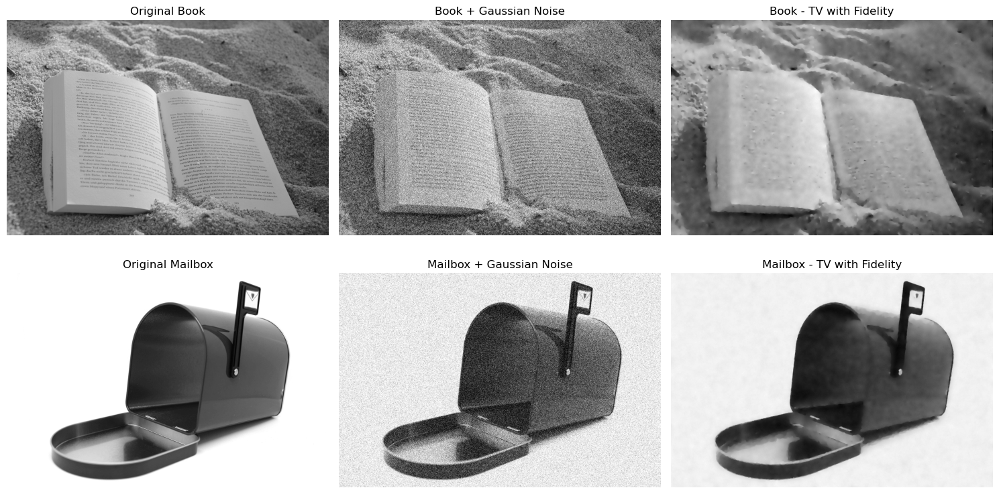

In [44]:
# Question 3

# TODO: Apply total variation denoising with fidelity term enabled to the two images with White Gaussian Noise
book_gauss_tv_fid = total_variation(book_gauss, 200, use_fidelity_term=True)
mailbox_gauss_tv_fid = total_variation(mailbox_gauss, 200, use_fidelity_term=True)

# TODO: Show the results
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

titles = [
    "Original Book", "Book + Gaussian Noise", "Book - TV with Fidelity",
    "Original Mailbox", "Mailbox + Gaussian Noise", "Mailbox - TV with Fidelity"
]

images = [
    book_in_sand, book_gauss, book_gauss_tv_fid,
    mailbox, mailbox_gauss, mailbox_gauss_tv_fid
]

for i in range(len(images)):
    axes[i].imshow(images[i], cmap='gray')
    axes[i].set_title(titles[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()